# Import Libraries

In [79]:
# Import the necessary libraries
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve
from sklearn.preprocessing import label_binarize
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras.applications import ResNet50
import matplotlib.pyplot as plt

# Load Dataset

In [80]:
# Load the image data
image_dir = './dtd-r1.0.1/dtd/images/'
class_names = os.listdir(image_dir)

X = []
y = []

for i, class_name in enumerate(class_names):
    class_dir = os.path.join(image_dir, class_name)
    for image_path in os.listdir(class_dir):
        image = keras.preprocessing.image.load_img(os.path.join(class_dir, image_path))
        image_array = keras.preprocessing.image.img_to_array(image)
        X.append(image_array)
        y.append(i)

# Convert the lists to numpy arrays
X = np.array(X)
y = np.array(y)

<ipython-input-80-ddfe85779b19>:17: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.array(X)


# Explore Dataset

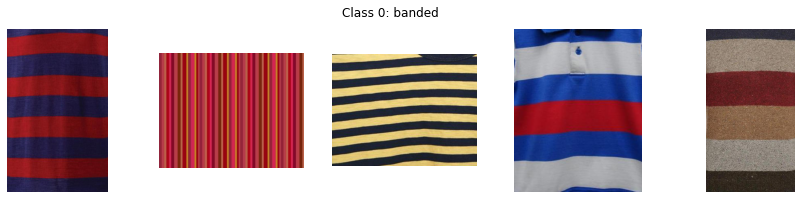

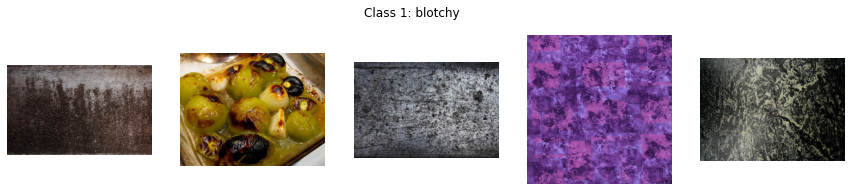

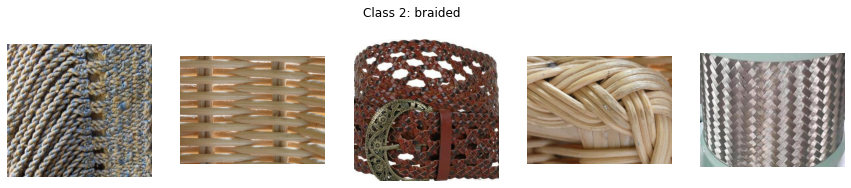

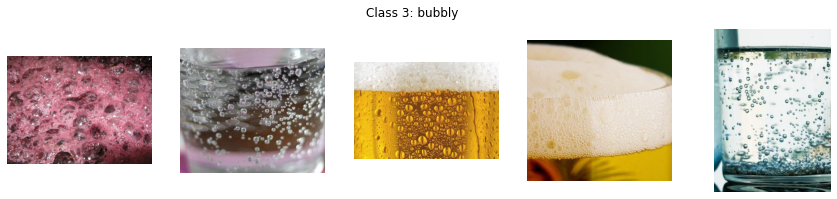

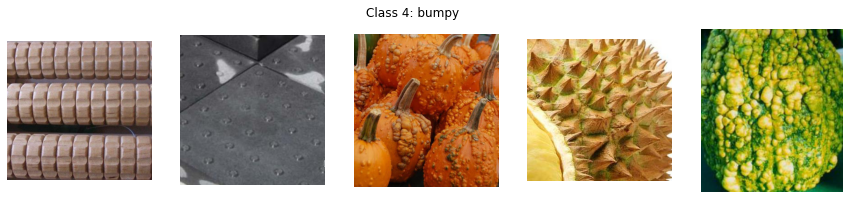

...

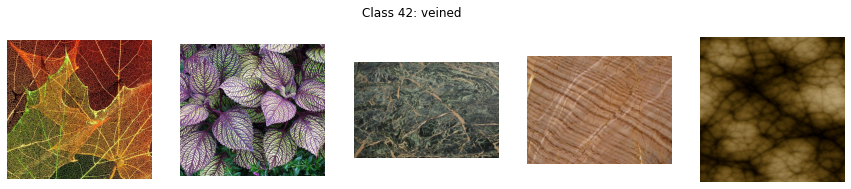

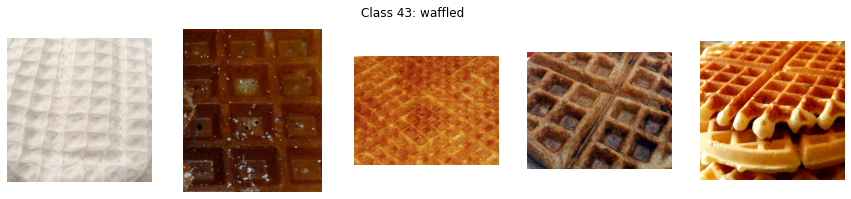

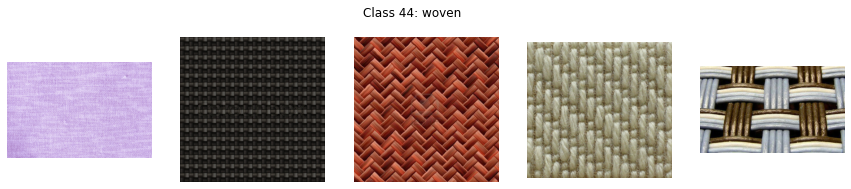

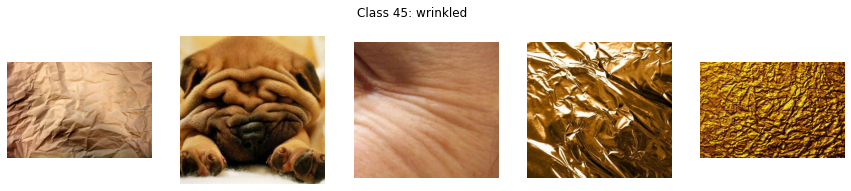

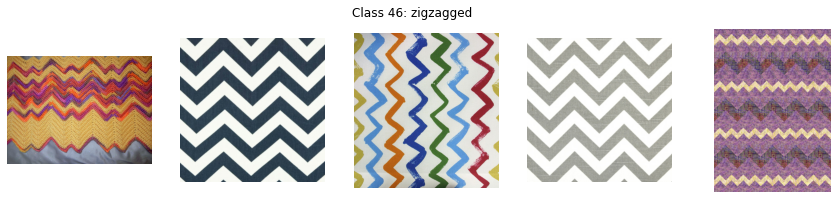

In [86]:
# Define the number of images to preview per class
num_images_per_class = 5

# Preview images for each class
for class_label, class_name in enumerate(class_names):
    # Find the indices of images belonging to the current class
    class_indices = np.where(y == class_label)[0]

    # Check if there are images available for the current class
    if len(class_indices) == 0:
        print(f"No images available for Class {class_label}: {class_name}")
        continue

    # Randomly select a subset of images to preview
    preview_indices = np.random.choice(class_indices, size=min(num_images_per_class, len(class_indices)), replace=False)

    # Plot the preview images
    fig, axes = plt.subplots(1, len(preview_indices), figsize=(15, 3))
    for i, index in enumerate(preview_indices):
        image = X[index].astype(np.uint8)
        axes[i].imshow(image)
        axes[i].axis('off')

    # Set the title of the plot as the class name
    fig.suptitle(f'Class {class_label}: {class_name}')

    # Show the plot
    plt.show()

In [87]:
# Count the total number of images 
total_images = len(X)
print("Total number of images:", total_images)

# Determine the image size and type
image_size = X[0].shape
image_type = type(X[1][0][0][0])
print("Image size:", image_size)
print("Image type:", image_type)

Total number of images: 5640
Image size: (300, 300, 3)
Image type: <class 'numpy.float32'>


In [95]:
# Check the shape of the data
print("X shape:", X.shape)
print("y shape:", y.shape)

# Check the number of classes
num_classes = len(class_names)
print("Number of classes:", num_classes)

# Check the distribution of classes
class_counts = np.bincount(y)
print("Class counts:", class_counts)

X shape: (5640,)
y shape: (5640,)
Number of classes: 47
Class counts: [120 120 120 120 120 120 120 120 120 120 120 120 120 120 120 120 120 120
 120 120 120 120 120 120 120 120 120 120 120 120 120 120 120 120 120 120
 120 120 120 120 120 120 120 120 120 120 120]


# Split Dataset

In [89]:
# Split the data into training and combined set (testing + validation)
X_train, X_combined, y_train, y_combined = train_test_split(X, y, test_size=0.2, random_state=42)

# Split the combined set into testing and validation sets
X_test, X_val, y_test, y_val = train_test_split(X_combined, y_combined, test_size=0.5, random_state=42)

# Now there are X_train, X_test, X_val as the respective feature sets
# and y_train, y_test, y_val as the respective target sets

In [90]:
print("X_train shape:", X_train.shape)
print("X_val shape:", X_val.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_val shape:", y_val.shape)
print("y_test shape:", y_test.shape)
print("Number of samples in X_train:", len(X_train))
print("Number of samples in X_val:", len(X_val))
print("Number of samples in X_test:", len(X_test))
print("Number of labels in y_train:", len(y_train))
print("Number of labels in y_val:", len(y_val))
print("Number of labels in y_test:", len(y_test))

X_train shape: (4512,)
X_val shape: (564,)
X_test shape: (564,)
y_train shape: (4512,)
y_val shape: (564,)
y_test shape: (564,)
Number of samples in X_train: 4512
Number of samples in X_val: 564
Number of samples in X_test: 564
Number of labels in y_train: 4512
Number of labels in y_val: 564
Number of labels in y_test: 564


# Pre-process Dataset

In [91]:
resized_X_train = []
resized_X_val = []
resized_X_test = []

# Resize images in the training set
for image in X_train:
    resized_image = cv2.resize(image, (224, 224))
    resized_X_train.append(resized_image)

# Resize images in the validation set
for image in X_val:
    resized_image = cv2.resize(image, (224, 224))
    resized_X_val.append(resized_image)
    
# Resize images in the testing set
for image in X_test:
    resized_image = cv2.resize(image, (224, 224))
    resized_X_test.append(resized_image)

# Convert the lists to numpy arrays
X_train = np.array(resized_X_train)
X_val = np.array(resized_X_val)
X_test = np.array(resized_X_test)

# Reshape the input data to the desired shape
X_train = X_train.reshape(X_train.shape[0], 224, 224, 3)
X_val = X_val.reshape(X_val.shape[0], 224, 224, 3)
X_test = X_test.reshape(X_test.shape[0], 224, 224, 3)

In [92]:
# Normalize X
X_train = X_train / 255.0
X_val = X_val / 255.0
X_test = X_test / 255.0

In [93]:
# Perform one-hot encoding on the labels
y_train = keras.utils.to_categorical(y_train, num_classes)
y_val = keras.utils.to_categorical(y_val, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)

# LeNet 5 Model

Epoch 1/20
36/36 [==============================] - 61s 2s/step - loss: 4.0446 - accuracy: 0.0235 - val_loss: 3.8281 - val_accuracy: 0.0213
Epoch 2/20
36/36 [==============================] - 61s 2s/step - loss: 3.8046 - accuracy: 0.0330 - val_loss: 3.7937 - val_accuracy: 0.0408
Epoch 3/20
36/36 [==============================] - 66s 2s/step - loss: 3.7191 - accuracy: 0.0667 - val_loss: 3.7697 - val_accuracy: 0.0550
Epoch 4/20
36/36 [==============================] - 69s 2s/step - loss: 3.5514 - accuracy: 0.1137 - val_loss: 3.8276 - val_accuracy: 0.0780
Epoch 5/20
36/36 [==============================] - 69s 2s/step - loss: 3.1494 - accuracy: 0.2108 - val_loss: 3.8722 - val_accuracy: 0.0922
Epoch 6/20
36/36 [==============================] - 70s 2s/step - loss: 2.5277 - accuracy: 0.3717 - val_loss: 4.2708 - val_accuracy: 0.0869
Epoch 7/20
36/36 [==============================] - 70s 2s/step - loss: 1.8446 - accuracy: 0.5470 - val_loss: 5.3815 - val_accuracy: 0.0709
Epoch 8/20
36/36 [==

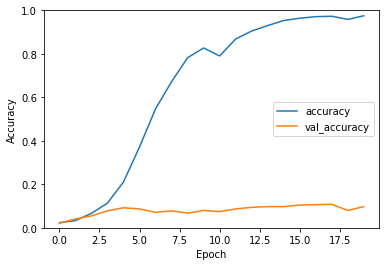

In [10]:
# Define the LeNet 5 model architecture
model = keras.Sequential([
    layers.Conv2D(6,kernel_size=(5,5),activation='relu',input_shape=(224,224,3)),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.Conv2D(16, kernel_size=(5,5), activation='relu'),
    layers.MaxPooling2D(pool_size=(2,2)),
    layers.Flatten(),
    layers.Dense(120, activation='relu'),
    layers.Dense(84, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=128,
    verbose=1,
    validation_data=(X_val, y_val)
)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='center right')

In [12]:
# Evaluate the model on the testing set
score = model.evaluate(X_test, y_test, verbose=2)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

18/18 - 2s - loss: 13.3695 - accuracy: 0.0851 - 2s/epoch - 115ms/step
Test Loss: 13.369486808776855
Test accuracy: 0.08510638028383255


18/18 [==============================] - 2s 107ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.00      0.00      0.00        16
           2       0.10      0.14      0.11        14
           3       0.13      0.13      0.13        15
           4       0.00      0.00      0.00        12
           5       0.11      0.23      0.15        13
           6       0.10      0.07      0.08        14
           7       0.00      0.00      0.00        10
           8       0.00      0.00      0.00        14
           9       0.33      0.11      0.16        19
          10       0.19      0.30      0.23        10
          11       0.00      0.00      0.00         9
          12       0.00      0.00      0.00        13
          13       0.11      0.06      0.08        17
          14       0.11      0.09      0.10        11
          15       0.00      0.00      0.00         7
   

C:\Users\josep\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\josep\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\josep\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


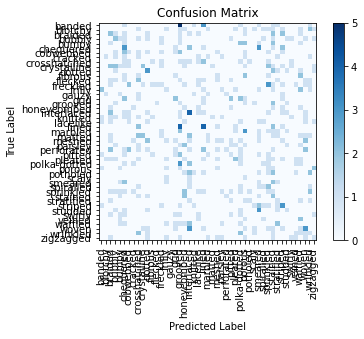

In [15]:
# Predict classes for the testing set
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)

# Calculate precision, recall, and other metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Calculate and plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(np.arange(len(class_names)), class_names, rotation=90)
plt.yticks(np.arange(len(class_names)), class_names)
plt.show()

18/18 [==============================] - 2s 118ms/step


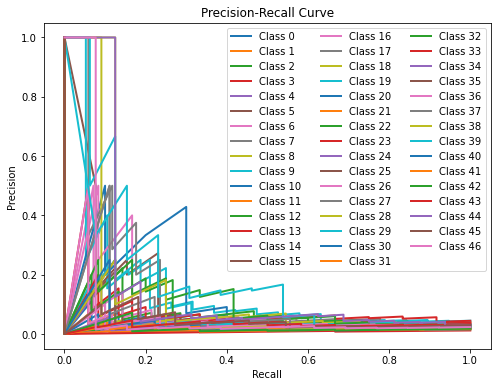

In [27]:
# Obtain the predicted probabilities for each class
y_pred_prob = model.predict(X_test)

# Binarize the true labels
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Calculate precision and recall for each class
precision = dict()
recall = dict()
for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_pred_prob[:, i])

# Plot precision-recall curve for each class
plt.figure(figsize=(8, 6))
for i in range(num_classes):
    plt.plot(recall[i], precision[i], lw=2, label=f'Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0), ncol=3)
plt.show()

# CNN Model

## CNN Model with 20 Epochs

In [28]:
# Define the CNN model architecture
model = keras.Sequential([
    layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=128,
    verbose=1,
    validation_data=(X_val, y_val)
)

Epoch 1/20
36/36 [==============================] - 156s 4s/step - loss: 4.4337 - accuracy: 0.0224 - val_loss: 4.1773 - val_accuracy: 0.0408
Epoch 2/20
36/36 [==============================] - 164s 5s/step - loss: 4.0893 - accuracy: 0.0268 - val_loss: 4.0152 - val_accuracy: 0.0266
Epoch 3/20
36/36 [==============================] - 164s 5s/step - loss: 3.9661 - accuracy: 0.0299 - val_loss: 3.9531 - val_accuracy: 0.0301
Epoch 4/20
36/36 [==============================] - 165s 5s/step - loss: 3.9176 - accuracy: 0.0370 - val_loss: 3.9213 - val_accuracy: 0.0319
Epoch 5/20
36/36 [==============================] - 157s 4s/step - loss: 3.8951 - accuracy: 0.0397 - val_loss: 3.9102 - val_accuracy: 0.0337
Epoch 6/20
36/36 [==============================] - 152s 4s/step - loss: 3.8761 - accuracy: 0.0401 - val_loss: 3.9066 - val_accuracy: 0.0461
Epoch 7/20
36/36 [==============================] - 155s 4s/step - loss: 3.8623 - accuracy: 0.0468 - val_loss: 3.8946 - val_accuracy: 0.0514
Epoch 8/20
36

## CNN Model with 50 Epochs 

Epoch 1/50
36/36 [==============================] - 149s 4s/step - loss: 4.4766 - accuracy: 0.0188 - val_loss: 4.1788 - val_accuracy: 0.0195
Epoch 2/50
36/36 [==============================] - 156s 4s/step - loss: 4.0969 - accuracy: 0.0215 - val_loss: 4.0316 - val_accuracy: 0.0266
Epoch 3/50
36/36 [==============================] - 156s 4s/step - loss: 3.9966 - accuracy: 0.0233 - val_loss: 3.9690 - val_accuracy: 0.0142
Epoch 4/50
36/36 [==============================] - 155s 4s/step - loss: 3.9480 - accuracy: 0.0270 - val_loss: 3.9328 - val_accuracy: 0.0124
Epoch 5/50
36/36 [==============================] - 156s 4s/step - loss: 3.9111 - accuracy: 0.0277 - val_loss: 3.8988 - val_accuracy: 0.0195
Epoch 6/50
36/36 [==============================] - 157s 4s/step - loss: 3.8857 - accuracy: 0.0326 - val_loss: 3.8806 - val_accuracy: 0.0248
Epoch 7/50
36/36 [==============================] - 156s 4s/step - loss: 3.8592 - accuracy: 0.0350 - val_loss: 3.8789 - val_accuracy: 0.0301
Epoch 8/50
36

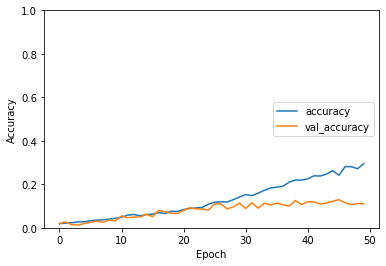

In [36]:
# Now with 50 epochs
model = keras.Sequential([
    layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    layers.MaxPooling2D(pool_size=(2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation='softmax')
])

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=128,
    verbose=1,
    validation_data=(X_val, y_val)
)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='center right')

In [78]:
# Evaluate the model on the testing set
score = model.evaluate(X_test, y_test, verbose=2)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

18/18 - 6s - loss: 3.5595 - accuracy: 0.0780 - 6s/epoch - 318ms/step
Test Loss: 3.5595102310180664
Test accuracy: 0.07801418751478195


# AlexNet Model

## AlexNet Model with 50 Epochs and Learning Rate 0.001

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 54, 54, 96)        34944     
                                                                 
 batch_normalization_10 (Bat  (None, 54, 54, 96)       384       
 chNormalization)                                                
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 26, 26, 96)       0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 26, 26, 256)       614656    
                                                                 
 batch_normalization_11 (Bat  (None, 26, 26, 256)      1024      
 chNormalization)                                                
                                                      

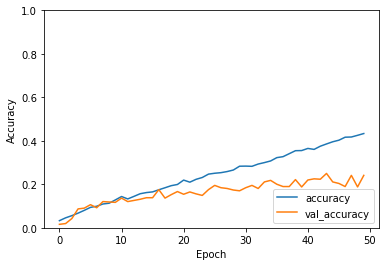

In [34]:
model = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(224, 224, 3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer=tf.optimizers.SGD(learning_rate=0.001), metrics=['accuracy'])
model.summary()

# Train the model
history = model.fit(
    X_train, y_train, 
    epochs=50,
    verbose=1,
    validation_data=(X_val, y_val)
)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()

In [35]:
# Evaluate the model on the testing set
score = model.evaluate(X_test, y_test, verbose=2)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

18/18 - 6s - loss: 3.0014 - accuracy: 0.2518 - 6s/epoch - 331ms/step
Test Loss: 3.0014026165008545
Test accuracy: 0.25177305936813354


18/18 [==============================] - 6s 323ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.60      0.40      0.48        15
           1       0.20      0.06      0.10        16
           2       0.29      0.14      0.19        14
           3       0.35      0.53      0.42        15
           4       0.00      0.00      0.00        12
           5       0.64      0.69      0.67        13
           6       0.35      0.43      0.39        14
           7       0.00      0.00      0.00        10
           8       0.60      0.21      0.32        14
           9       0.36      0.21      0.27        19
          10       0.43      0.30      0.35        10
          11       0.12      0.33      0.18         9
          12       0.17      0.31      0.22        13
          13       0.47      0.47      0.47        17
          14       0.00      0.00      0.00        11
          15       0.10      0.14      0.12         7
   

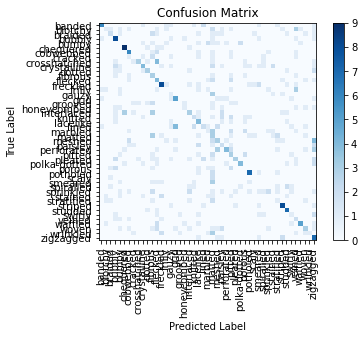

In [36]:
# Predict classes for the testing set
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)

# Convert probabilities to class labels
y_test = np.argmax(y_test, axis=1)

# Calculate precision, recall, and other metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Calculate and plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(np.arange(len(class_names)), class_names, rotation=90)
plt.yticks(np.arange(len(class_names)), class_names)
plt.show()

18/18 [==============================] - 6s 329ms/step


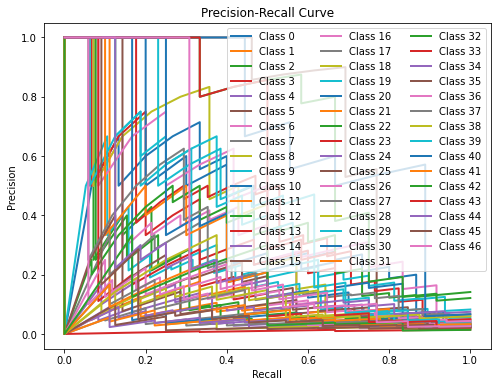

In [37]:
# Obtain the predicted probabilities for each class
y_pred_prob = model.predict(X_test)

# Binarize the true labels
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Calculate precision and recall for each class
precision = dict()
recall = dict()
for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_pred_prob[:, i])

# Plot precision-recall curve for each class
plt.figure(figsize=(8, 6))
for i in range(num_classes):
    plt.plot(recall[i], precision[i], lw=2, label=f'Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0), ncol=3)
plt.show()

## AlexNet Model with 50 Epochs and Learning Rate 0.01

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_15 (Conv2D)          (None, 54, 54, 96)        34944     
                                                                 
 batch_normalization_15 (Bat  (None, 54, 54, 96)       384       
 chNormalization)                                                
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 26, 26, 96)       0         
 2D)                                                             
                                                                 
 conv2d_16 (Conv2D)          (None, 26, 26, 256)       614656    
                                                                 
 batch_normalization_16 (Bat  (None, 26, 26, 256)      1024      
 chNormalization)                                                
                                                      

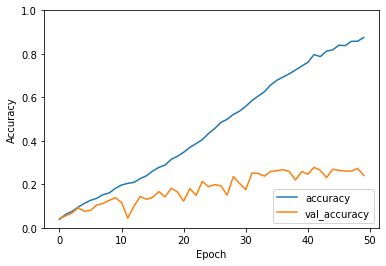

In [47]:
model = keras.models.Sequential([
    keras.layers.Conv2D(filters=96, kernel_size=(11,11), strides=(4,4), activation='relu', input_shape=(224, 224, 3)),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=256, kernel_size=(5,5), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=384, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2D(filters=256, kernel_size=(3,3), strides=(1,1), activation='relu', padding="same"),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(pool_size=(3,3), strides=(2,2)),
    keras.layers.Flatten(),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4096, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(num_classes, activation='softmax')
])

model.compile(loss='categorical_crossentropy', optimizer=tf.optimizers.SGD(learning_rate=0.01), metrics=['accuracy'])
model.summary()

# Train the model
history = model.fit(
    X_train, y_train, 
    epochs=50,
    verbose=1,
    validation_data=(X_val, y_val)
)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()

In [48]:
# Evaluate the model on the testing set
score = model.evaluate(X_test, y_test, verbose=2)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

18/18 - 6s - loss: 3.6180 - accuracy: 0.2677 - 6s/epoch - 319ms/step
Test Loss: 3.6179747581481934
Test accuracy: 0.2677305042743683


18/18 [==============================] - 6s 303ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.42      0.33      0.37        15
           1       0.00      0.00      0.00        16
           2       0.40      0.14      0.21        14
           3       0.33      0.27      0.30        15
           4       0.00      0.00      0.00        12
           5       0.71      0.77      0.74        13
           6       0.38      0.36      0.37        14
           7       0.20      0.10      0.13        10
           8       0.36      0.29      0.32        14
           9       0.50      0.11      0.17        19
          10       0.26      0.50      0.34        10
          11       0.08      0.22      0.12         9
          12       0.23      0.23      0.23        13
          13       0.67      0.47      0.55        17
          14       0.17      0.09      0.12        11
          15       0.25      0.14      0.18         7
   

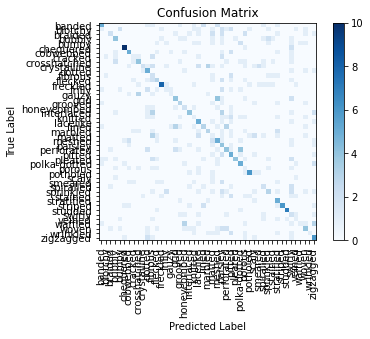

In [49]:
# Predict classes for the testing set
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)

# Convert probabilities to class labels
y_test = np.argmax(y_test, axis=1)

# Calculate precision, recall, and other metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Calculate and plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(np.arange(len(class_names)), class_names, rotation=90)
plt.yticks(np.arange(len(class_names)), class_names)
plt.show()

18/18 [==============================] - 5s 295ms/step


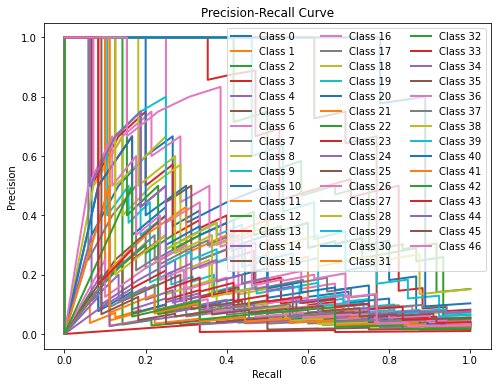

In [50]:
# Obtain the predicted probabilities for each class
y_pred_prob = model.predict(X_test)

# Binarize the true labels
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Calculate precision and recall for each class
precision = dict()
recall = dict()
for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_pred_prob[:, i])

# Plot precision-recall curve for each class
plt.figure(figsize=(8, 6))
for i in range(num_classes):
    plt.plot(recall[i], precision[i], lw=2, label=f'Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0), ncol=3)
plt.show()

# Inception V4 Model

## Inception V4 Model using Adam Optimizer

Epoch 1/20
141/141 [==============================] - 195s 1s/step - loss: 2.6797 - accuracy: 0.3511 - val_loss: 1.7677 - val_accuracy: 0.5461
Epoch 2/20
141/141 [==============================] - 191s 1s/step - loss: 1.5153 - accuracy: 0.5816 - val_loss: 1.5624 - val_accuracy: 0.5674
Epoch 3/20
141/141 [==============================] - 194s 1s/step - loss: 1.2100 - accuracy: 0.6598 - val_loss: 1.4754 - val_accuracy: 0.6082
Epoch 4/20
141/141 [==============================] - 195s 1s/step - loss: 1.0368 - accuracy: 0.6995 - val_loss: 1.3463 - val_accuracy: 0.6348
Epoch 5/20
141/141 [==============================] - 188s 1s/step - loss: 0.8762 - accuracy: 0.7329 - val_loss: 1.4532 - val_accuracy: 0.6064
Epoch 6/20
141/141 [==============================] - 188s 1s/step - loss: 0.7406 - accuracy: 0.7719 - val_loss: 1.4581 - val_accuracy: 0.6064
Epoch 7/20
141/141 [==============================] - 188s 1s/step - loss: 0.6212 - accuracy: 0.8036 - val_loss: 1.4069 - val_accuracy: 0.6578

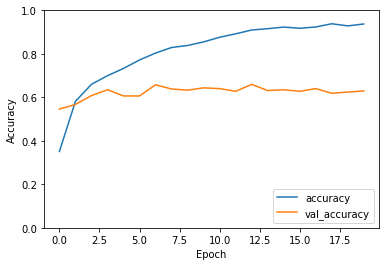

In [61]:
# Load the pre-trained InceptionV4 model without the top layer
inceptionv4 = keras.applications.InceptionV3(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3),
    pooling=None
)

# Add a new top layer for classification
x = layers.GlobalAveragePooling2D()(inceptionv4.output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(num_classes, activation='softmax')(x)

# Define the new model
model = keras.Model(inputs=inceptionv4.input, outputs=predictions)

# Freeze the pre-trained layers
for layer in inceptionv4.layers:
    layer.trainable = False

# Compile the model
model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    verbose=1,
    validation_data=(X_val, y_val)
)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()

In [62]:
# Evaluate the model on the testing set
score = model.evaluate(X_test, y_test, verbose=2)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

18/18 - 21s - loss: 1.7414 - accuracy: 0.6401 - 21s/epoch - 1s/step
Test Loss: 1.7413880825042725
Test accuracy: 0.640070915222168


18/18 [==============================] - 23s 1s/step
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.67      0.74        15
           1       0.56      0.31      0.40        16
           2       0.90      0.64      0.75        14
           3       0.82      0.60      0.69        15
           4       0.58      0.58      0.58        12
           5       1.00      0.85      0.92        13
           6       0.83      0.71      0.77        14
           7       0.73      0.80      0.76        10
           8       0.65      0.93      0.76        14
           9       0.87      0.68      0.76        19
          10       0.70      0.70      0.70        10
          11       0.44      0.89      0.59         9
          12       0.53      0.62      0.57        13
          13       0.82      0.82      0.82        17
          14       0.78      0.64      0.70        11
          15       0.60      0.86      0.71         7
     

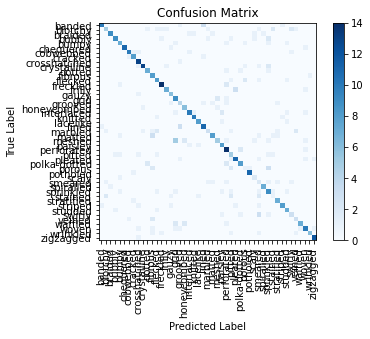

In [63]:
# Predict classes for the testing set
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)

# Convert probabilities to class labels
y_test = np.argmax(y_test, axis=1)

# Calculate precision, recall, and other metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Calculate and plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(np.arange(len(class_names)), class_names, rotation=90)
plt.yticks(np.arange(len(class_names)), class_names)
plt.show()

18/18 [==============================] - 22s 1s/step


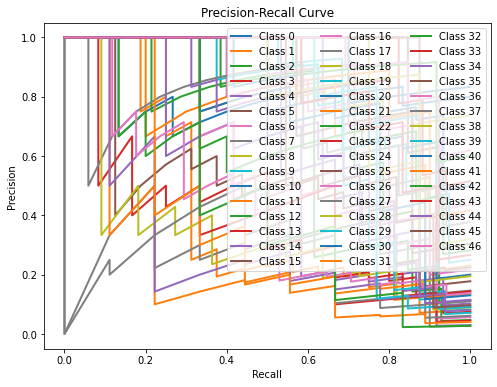

In [64]:
# Obtain the predicted probabilities for each class
y_pred_prob = model.predict(X_test)

# Binarize the true labels
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Calculate precision and recall for each class
precision = dict()
recall = dict()
for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_pred_prob[:, i])

# Plot precision-recall curve for each class
plt.figure(figsize=(8, 6))
for i in range(num_classes):
    plt.plot(recall[i], precision[i], lw=2, label=f'Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0), ncol=3)
plt.show()

## Inception V4 Model using SGD Optimizer with 20 Epochs

Epoch 1/20
141/141 [==============================] - 194s 1s/step - loss: 4.2191 - accuracy: 0.0244 - val_loss: 3.8667 - val_accuracy: 0.0337
Epoch 2/20
141/141 [==============================] - 189s 1s/step - loss: 3.9424 - accuracy: 0.0468 - val_loss: 3.6944 - val_accuracy: 0.1011
Epoch 3/20
141/141 [==============================] - 181s 1s/step - loss: 3.7428 - accuracy: 0.0749 - val_loss: 3.5489 - val_accuracy: 0.1684
Epoch 4/20
141/141 [==============================] - 175s 1s/step - loss: 3.5939 - accuracy: 0.1168 - val_loss: 3.4218 - val_accuracy: 0.2145
Epoch 5/20
141/141 [==============================] - 174s 1s/step - loss: 3.4284 - accuracy: 0.1525 - val_loss: 3.3053 - val_accuracy: 0.2695
Epoch 6/20
141/141 [==============================] - 174s 1s/step - loss: 3.2982 - accuracy: 0.1902 - val_loss: 3.1970 - val_accuracy: 0.3103
Epoch 7/20
141/141 [==============================] - 186s 1s/step - loss: 3.1808 - accuracy: 0.2272 - val_loss: 3.0935 - val_accuracy: 0.3245

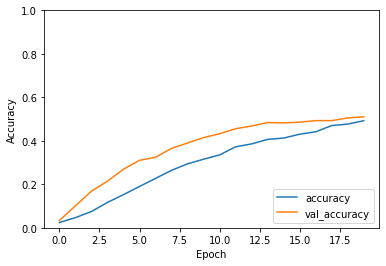

In [74]:
# Load the pre-trained InceptionV4 model without the top layer
inceptionv4 = keras.applications.InceptionV3(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3),
    pooling=None
)

# Add a new top layer for classification
x = layers.GlobalAveragePooling2D()(inceptionv4.output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(num_classes, activation='softmax')(x)

# Define the new model
model = keras.Model(inputs=inceptionv4.input, outputs=predictions)

# Freeze the pre-trained layers
for layer in inceptionv4.layers:
    layer.trainable = False

# Compile the model
model.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.001), 
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=20,
    batch_size=32,
    verbose=1,
    validation_data=(X_val, y_val)
)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()

In [75]:
# Evaluate the model on the testing set
score = model.evaluate(X_test, y_test, verbose=2)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

18/18 - 32s - loss: 2.0861 - accuracy: 0.5177 - 32s/epoch - 2s/step
Test Loss: 2.0860631465911865
Test accuracy: 0.5177304744720459


18/18 [==============================] - 39s 2s/step
Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.60      0.56        15
           1       0.50      0.06      0.11        16
           2       0.89      0.57      0.70        14
           3       0.67      0.67      0.67        15
           4       0.67      0.17      0.27        12
           5       0.75      0.69      0.72        13
           6       0.86      0.86      0.86        14
           7       0.42      0.50      0.45        10
           8       0.50      0.36      0.42        14
           9       0.72      0.68      0.70        19
          10       0.47      0.70      0.56        10
          11       0.73      0.89      0.80         9
          12       0.67      0.31      0.42        13
          13       0.71      0.59      0.65        17
          14       0.55      0.55      0.55        11
          15       0.33      0.86      0.48         7
     

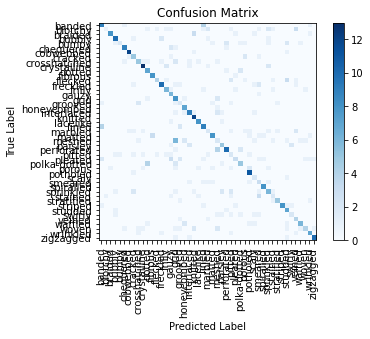

In [76]:
# Predict classes for the testing set
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)

# Convert probabilities to class labels
y_test = np.argmax(y_test, axis=1)

# Calculate precision, recall, and other metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Calculate and plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(np.arange(len(class_names)), class_names, rotation=90)
plt.yticks(np.arange(len(class_names)), class_names)
plt.show()

18/18 [==============================] - 32s 2s/step


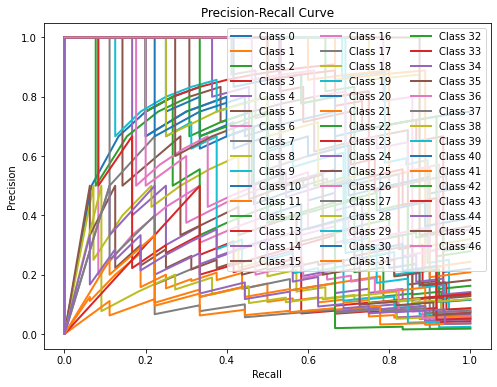

In [77]:
# Obtain the predicted probabilities for each class
y_pred_prob = model.predict(X_test)

# Binarize the true labels
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Calculate precision and recall for each class
precision = dict()
recall = dict()
for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_pred_prob[:, i])

# Plot precision-recall curve for each class
plt.figure(figsize=(8, 6))
for i in range(num_classes):
    plt.plot(recall[i], precision[i], lw=2, label=f'Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0), ncol=3)
plt.show()

## Inception V4 Model using SGD Optimizer with 50 Epochs

Epoch 1/50
141/141 [==============================] - 308s 2s/step - loss: 4.2053 - accuracy: 0.0226 - val_loss: 3.7669 - val_accuracy: 0.0762
Epoch 2/50
141/141 [==============================] - 273s 2s/step - loss: 3.8973 - accuracy: 0.0439 - val_loss: 3.6132 - val_accuracy: 0.1401
Epoch 3/50
141/141 [==============================] - 248s 2s/step - loss: 3.7045 - accuracy: 0.0858 - val_loss: 3.4800 - val_accuracy: 0.2021
Epoch 4/50
141/141 [==============================] - 189s 1s/step - loss: 3.5298 - accuracy: 0.1274 - val_loss: 3.3581 - val_accuracy: 0.2624
Epoch 5/50
141/141 [==============================] - 207s 1s/step - loss: 3.3801 - accuracy: 0.1693 - val_loss: 3.2417 - val_accuracy: 0.2996
Epoch 6/50
141/141 [==============================] - 202s 1s/step - loss: 3.2572 - accuracy: 0.2086 - val_loss: 3.1301 - val_accuracy: 0.3387
Epoch 7/50
141/141 [==============================] - 210s 1s/step - loss: 3.1176 - accuracy: 0.2462 - val_loss: 3.0272 - val_accuracy: 0.3599

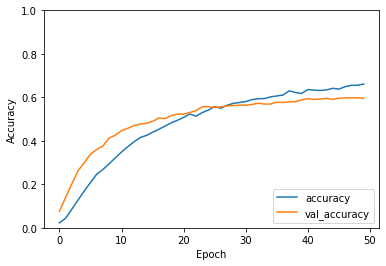

In [94]:
# Load the pre-trained InceptionV4 model without the top layer
inceptionv4 = keras.applications.InceptionV3(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3),
    pooling=None
)

# Add a new top layer for classification
x = layers.GlobalAveragePooling2D()(inceptionv4.output)
x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(num_classes, activation='softmax')(x)

# Define the new model
model = keras.Model(inputs=inceptionv4.input, outputs=predictions)

# Freeze the pre-trained layers
for layer in inceptionv4.layers:
    layer.trainable = False

# Compile the model
model.compile(
    optimizer=tf.optimizers.SGD(learning_rate=0.001), 
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    verbose=1,
    validation_data=(X_val, y_val)
)

plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')
plt.show()

In [96]:
# Evaluate the model on the testing set
score = model.evaluate(X_test, y_test, verbose=2)
print('Test Loss:', score[0])
print('Test accuracy:', score[1])

18/18 - 21s - loss: 1.5318 - accuracy: 0.6064 - 21s/epoch - 1s/step
Test Loss: 1.5318270921707153
Test accuracy: 0.6063829660415649


18/18 [==============================] - 24s 1s/step
Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.60      0.62        15
           1       0.50      0.25      0.33        16
           2       0.75      0.64      0.69        14
           3       0.71      0.80      0.75        15
           4       0.57      0.33      0.42        12
           5       0.77      0.77      0.77        13
           6       0.85      0.79      0.81        14
           7       0.57      0.80      0.67        10
           8       0.89      0.57      0.70        14
           9       0.81      0.68      0.74        19
          10       0.50      0.60      0.55        10
          11       0.67      0.89      0.76         9
          12       0.69      0.69      0.69        13
          13       0.86      0.71      0.77        17
          14       0.58      0.64      0.61        11
          15       0.56      0.71      0.63         7
     

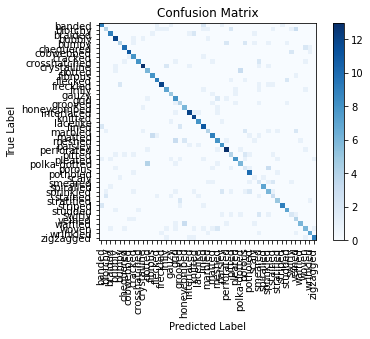

In [97]:
# Predict classes for the testing set
y_pred = model.predict(X_test)
y_pred = np.argmax(y_pred, axis=1)

# Convert probabilities to class labels
y_test = np.argmax(y_test, axis=1)

# Calculate precision, recall, and other metrics
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Calculate and plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.xticks(np.arange(len(class_names)), class_names, rotation=90)
plt.yticks(np.arange(len(class_names)), class_names)
plt.show()

18/18 [==============================] - 21s 1s/step


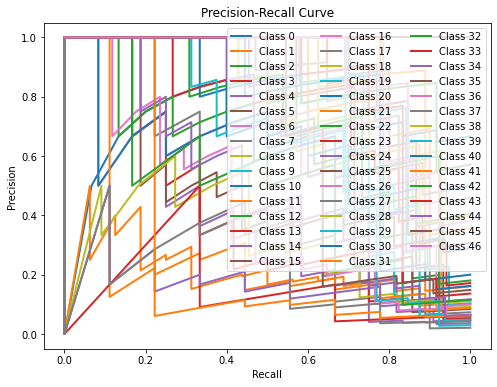

In [98]:
# Obtain the predicted probabilities for each class
y_pred_prob = model.predict(X_test)

# Binarize the true labels
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))

# Calculate precision and recall for each class
precision = dict()
recall = dict()
for i in range(num_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_pred_prob[:, i])

# Plot precision-recall curve for each class
plt.figure(figsize=(8, 6))
for i in range(num_classes):
    plt.plot(recall[i], precision[i], lw=2, label=f'Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='upper right', bbox_to_anchor=(1.0, 1.0), ncol=3)
plt.show()